# Retinal AV Segmentation: Multiclass (Artery / Vein / Crossing / Uncertainty)

This notebook trains a **MorphoBIFPNUNet** for **5-class segmentation** on fundus images:

| Class | Label colour | Index |
|-------|--------------|-------|
| Background  | Black  | 0 |
| Artery      | Red    | 1 |
| Vein        | Blue   | 2 |
| Crossing    | Green  | 3 |
| Uncertainty | White  | 4 |

**Dataset layout** (each split folder):
```
Fundus-AVSeg-prep-data/
  images/        *.png          (fundus images)
  annotation/    *.png          (RGB multiclass label maps)
  npy/           *_liot_eg.npy  (LIOT feature arrays)
```

## Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
import itertools
import pandas as pd
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision
import torchvision.transforms as T

import math
import cv2
from pathlib import Path

import skimage
from skimage.measure import label, regionprops
from skimage import morphology
import torchvision.models as models
from scipy.spatial.distance import pdist, squareform
from codecarbon import EmissionsTracker
import copy, os, time
import matplotlib.gridspec as gridspec

print("All imports successful.")

All imports successful.


## Multiclass Constants

In [2]:
NUM_CLASSES   = 5
CLASS_NAMES   = {0: 'Background', 1: 'Artery', 2: 'Vein', 3: 'Crossing', 4: 'Uncertainty'}
CLASS_COLORS  = {
    0: np.array([  0,   0,   0], dtype=np.uint8),  # Background : black
    1: np.array([255,   0,   0], dtype=np.uint8),  # Artery     : red
    2: np.array([  0,   0, 255], dtype=np.uint8),  # Vein       : blue
    3: np.array([  0, 255,   0], dtype=np.uint8),  # Crossing   : green
    4: np.array([255, 255, 255], dtype=np.uint8),  # Uncertainty: white
}
VESSEL_CLASSES = [1, 2, 3]   # classes used for mean Dice (exclude bg & uncertainty)

print(f"Multiclass segmentation: {NUM_CLASSES} classes")
for k, v in CLASS_NAMES.items():
    print(f"  {k} = {v}")

Multiclass segmentation: 5 classes
  0 = Background
  1 = Artery
  2 = Vein
  3 = Crossing
  4 = Uncertainty


## Dataset Class

Loads PNG fundus images, LIOT `.npy` feature arrays, and converts RGB annotation maps to integer class masks.

In [3]:
class ImageDataset(data.Dataset):
    """
    Multiclass retinal AV segmentation dataset.

    Expected layout per split root:
        <root>/
            images/       *.png           (fundus images, RGB)
            annotation/   *.png           (RGB multiclass label maps)
            npy/          *_liot_eg.npy   (LIOT feature arrays, shape C×H×W)

    Label colour → class index:
        black  (0,0,0)       → 0  background
        red    (255,0,0)     → 1  artery
        blue   (0,0,255)     → 2  vein
        green  (0,255,0)     → 3  crossing
        white  (255,255,255) → 4  uncertainty
    """

    def __init__(self, root, new_size=592, supervised=True):
        self.root       = Path(root)
        self.supervised = supervised
        self.new_size   = new_size
        self.imagesize  = None

        img_dir = self.root / 'images'
        npy_dir = self.root / 'npy'
        ann_dir = self.root / 'annotation'

        # Discover images; derive matching LIOT and annotation paths by stem
        self.image_paths         = sorted(img_dir.glob('*.png'))
        self.image_liot_eg_paths = []
        self.label_paths         = []

        for img_path in self.image_paths:
            stem = img_path.stem                                    # e.g. '001_G'
            self.image_liot_eg_paths.append(npy_dir / f'{stem}_liot_eg.npy')
            if self.supervised:
                self.label_paths.append(ann_dir / f'{stem}.png')

        # ── Debug info ────────────────────────────────────────────────────────
        print(f"Dataset root        : {root}")
        print(f"  Images found      : {len(self.image_paths)}")
        print(f"  LIOT files found  : {len(self.image_liot_eg_paths)}")
        if self.supervised:
            print(f"  Annotations found : {len(self.label_paths)}")
        if self.image_paths:
            print(f"  First 5 images    : {[p.name for p in self.image_paths[:5]]}")

    # ── Padding helpers ───────────────────────────────────────────────────────

    def borders(self, original_size):
        """Return (left, top, right, bottom) padding to reach self.new_size."""
        H, W    = original_size
        delta_h = max(self.new_size - H, 0)
        delta_w = max(self.new_size - W, 0)
        top     = delta_h // 2
        bottom  = delta_h - top
        left    = delta_w // 2
        right   = delta_w - left
        return left, top, right, bottom

    # ── RGB annotation → integer class mask ───────────────────────────────────

    @staticmethod
    def rgb_to_class_mask(rgb_array):
        """
        Convert an RGB annotation array (H, W, 3) to an integer class mask (H, W).

        Colour thresholds are intentionally relaxed to handle minor JPEG/PNG
        compression artefacts while remaining mutually exclusive.

        Returns
        -------
        mask : np.ndarray, dtype int64, shape (H, W)
            Pixel-wise class indices (0–4).
        """
        r, g, b = rgb_array[:, :, 0], rgb_array[:, :, 1], rgb_array[:, :, 2]
        mask = np.zeros(rgb_array.shape[:2], dtype=np.int64)

        # Artery  – red-dominant
        mask[(r > 180) & (g < 80)  & (b < 80)]  = 1
        # Vein    – blue-dominant
        mask[(r < 80)  & (g < 80)  & (b > 180)] = 2
        # Crossing – green-dominant
        mask[(r < 80)  & (g > 180) & (b < 80)]  = 3
        # Uncertainty – bright in all three channels
        mask[(r > 180) & (g > 180) & (b > 180)] = 4
        # Background stays 0

        return mask

    # ── Dataset protocol ──────────────────────────────────────────────────────

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        # ── Fundus image ──────────────────────────────────────────────────────
        image = Image.open(self.image_paths[index]).convert('RGB')
        self.imagesize       = np.array(image).shape[:2]    # (H, W)
        left, top, right, bottom = self.borders(self.imagesize)
        pad = (left, top, right, bottom)

        img_tf = T.Compose([T.ToTensor(), T.Pad(pad)])
        image  = img_tf(image)                              # (3, H', W')

        # ── LIOT features ─────────────────────────────────────────────────────
        liot = np.load(self.image_liot_eg_paths[index])     # (C, H, W)
        liot = img_tf(liot.transpose(1, 2, 0))              # (C, H', W')

        # ── Annotation → integer class mask (LongTensor) ─────────────────────
        if self.supervised:
            ann_rgb = np.array(
                Image.open(self.label_paths[index]).convert('RGB')
            )                                               # (H, W, 3)
            mask = self.rgb_to_class_mask(ann_rgb)          # (H, W) int64
            mask = np.pad(mask,
                          ((top, bottom), (left, right)),
                          mode='constant', constant_values=0)
            label = torch.from_numpy(mask)                  # LongTensor (H', W')
            return image, liot, label

        return image, liot

## Load Data

Dataset root        : /home/mefeki/Bureau/work/Fundus-AVSeg-prep-data/test
  Images found      : 20
  LIOT files found  : 20
  Annotations found : 20
  First 5 images    : ['081_D.png', '082_N.png', '083_G.png', '084_D.png', '085_N.png']
Dataset root        : /home/mefeki/Bureau/work/Fundus-AVSeg-prep-data/train
  Images found      : 80
  LIOT files found  : 80
  Annotations found : 80
  First 5 images    : ['001_G.png', '002_N.png', '003_N.png', '004_D.png', '005_N.png']
Dataset sizes: {'train supervised': 80, 'test': 20}
Image shape     : torch.Size([1, 3, 1280, 1280])
LIOT shape      : torch.Size([1, 10, 1280, 1280])
Label shape     : torch.Size([1, 1280, 1280])   dtype: torch.int64
Unique classes  : [0, 1, 2, 3]


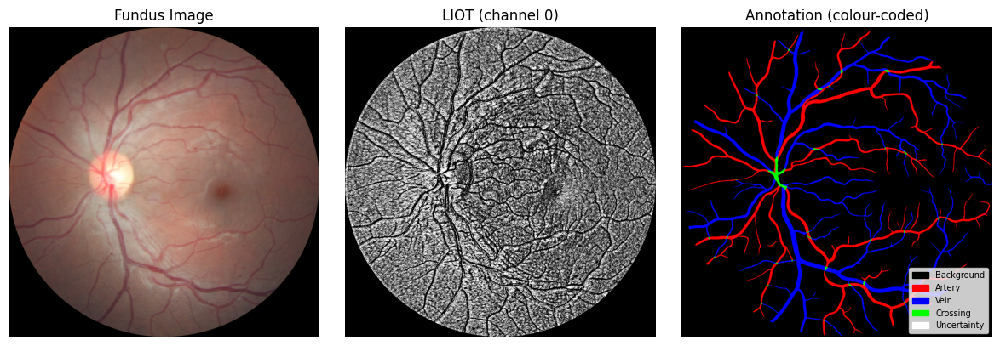

In [4]:
# ── Paths ─────────────────────────────────────────────────────────────────────
# Each split folder must contain images/, annotation/, and npy/ subfolders.
root = r"/home/mefeki/Bureau/work/Fundus-AVSeg-prep-data"

test_dataset              = ImageDataset(root=os.path.join(root, 'test'))
train_dataset_supervised  = ImageDataset(root=os.path.join(root, 'train'))

train_dataloader_supervised = data.DataLoader(
    train_dataset_supervised, shuffle=True, batch_size=2)
test_dataloader = data.DataLoader(test_dataset, shuffle=False, batch_size=1)

dataloaders   = {'train supervised': train_dataloader_supervised,
                 'test':             test_dataloader}
dataset_sizes = {'train supervised': len(train_dataset_supervised),
                 'test':             len(test_dataset)}
batch_sizes   = {'train supervised': 2, 'test': 1}

print("Dataset sizes:", dataset_sizes)

# ── Quick sanity-check visualisation ──────────────────────────────────────────
it = iter(dataloaders['test'])
inputs, inputs_LIOT_eg, labels = next(it)

print("Image shape     :", inputs.shape)
print("LIOT shape      :", inputs_LIOT_eg.shape)
print("Label shape     :", labels.shape, "  dtype:", labels.dtype)
print("Unique classes  :", labels.unique().tolist())

original_size = T.CenterCrop(test_dataset.imagesize)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# RGB image
out_inputs = torchvision.utils.make_grid(inputs)
axes[0].imshow(out_inputs.permute(1, 2, 0).clamp(0, 1))
axes[0].set_title('Fundus Image')
axes[0].axis('off')

# LIOT (first channel)
axes[1].imshow(inputs_LIOT_eg[0, 0].numpy(), cmap='gray')
axes[1].set_title('LIOT (channel 0)')
axes[1].axis('off')

# Colour-coded ground-truth label
lbl_np  = labels[0].numpy()                             # (H', W')
lbl_rgb = np.zeros((*lbl_np.shape, 3), dtype=np.uint8)
for cls_idx, color in CLASS_COLORS.items():
    lbl_rgb[lbl_np == cls_idx] = color
axes[2].imshow(lbl_rgb)
axes[2].set_title('Annotation (colour-coded)')
axes[2].axis('off')

# Legend
from matplotlib.patches import Patch
legend_handles = [
    Patch(color=np.array(c)/255, label=n)
    for c, n in zip(CLASS_COLORS.values(), CLASS_NAMES.values())
]
axes[2].legend(handles=legend_handles, loc='lower right', fontsize=7)

fig.tight_layout()
plt.show()

## Colour-Map Utility

In [5]:
def class_to_rgb(mask_np):
    """
    Convert an integer class mask (H, W) to a colour-coded RGB image (H, W, 3).

    Parameters
    ----------
    mask_np : np.ndarray, shape (H, W), dtype int
        Pixel-wise class indices (0 = background … 4 = uncertainty).

    Returns
    -------
    rgb : np.ndarray, shape (H, W, 3), dtype uint8
    """
    rgb = np.zeros((*mask_np.shape, 3), dtype=np.uint8)
    for cls_idx, color in CLASS_COLORS.items():
        rgb[mask_np == cls_idx] = color
    return rgb

## Network Architecture

The architecture is unchanged except for the **output head**, which now produces `NUM_CLASSES = 5` logit maps instead of 1.

In [6]:
# ===========================================================================
# Shared building blocks
# ===========================================================================

class DoubleConv(nn.Module):
    """Two 3×3 conv-BN-ReLU layers."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.doubleconv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.doubleconv(x)


class ConvBlock(nn.Module):
    """Two bias-free 3×3 conv-BN-ReLU layers."""
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.conv(x)


class Encoder(nn.Module):
    """Standard convolutional encoder; returns one feature map per level."""
    def __init__(self, in_ch=3, base_ch=64, depth=4):
        super().__init__()
        chs = [base_ch * (2 ** i) for i in range(depth)]
        self.blocks = nn.ModuleList()
        self.pools  = nn.ModuleList()
        in_c = in_ch
        for c in chs:
            self.blocks.append(ConvBlock(in_c, c))
            self.pools.append(nn.MaxPool2d(2))
            in_c = c
        self.out_channels = chs

    def forward(self, x):
        feats = []
        for block, pool in zip(self.blocks, self.pools):
            x = block(x)
            feats.append(x)
            x = pool(x)
        return feats


class UpBlock(nn.Module):
    """Transpose-conv upsampling + skip concatenation + ConvBlock."""
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up   = nn.ConvTranspose2d(in_ch, out_ch, 2, stride=2)
        self.conv = ConvBlock(out_ch + skip_ch, out_ch)

    def forward(self, x, skip):
        x = self.up(x)
        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(x, size=skip.shape[-2:],
                              mode='bilinear', align_corners=False)
        return self.conv(torch.cat([skip, x], dim=1))


# ===========================================================================
# BiFPN neck
# ===========================================================================

class BiFPN(nn.Module):
    """
    Bidirectional Feature Pyramid Network with learned fast-normalised fusion.
    """
    def __init__(self, channels, num_layers=2, eps=1e-4):
        super().__init__()
        self.eps        = eps
        self.num_levels = len(channels)
        self.num_layers = num_layers

        self.convs_td = nn.ModuleList([ConvBlock(c, c) for c in channels])
        self.convs_bu = nn.ModuleList([ConvBlock(c, c) for c in channels])

        self.w_td = nn.Parameter(torch.ones(num_layers, self.num_levels, 2))
        self.w_bu = nn.Parameter(torch.ones(num_layers, self.num_levels, 3))

    def forward(self, feats):
        P = feats
        for l in range(self.num_layers):
            td = [None] * self.num_levels
            td[-1] = P[-1]
            for i in reversed(range(self.num_levels - 1)):
                w  = F.relu(self.w_td[l, i])
                w  = w / (w.sum() + self.eps)
                up = F.interpolate(td[i + 1], size=P[i].shape[-2:],
                                   mode='bilinear', align_corners=False)
                td[i] = self.convs_td[i](w[0] * P[i] + w[1] * up)

            bu = [None] * self.num_levels
            bu[0] = td[0]
            for i in range(1, self.num_levels):
                w    = F.relu(self.w_bu[l, i])
                w    = w / (w.sum() + self.eps)
                down = F.max_pool2d(bu[i - 1], 2)
                if down.shape[-2:] != td[i].shape[-2:]:
                    down = F.interpolate(down, size=td[i].shape[-2:],
                                         mode='bilinear', align_corners=False)
                bu[i] = self.convs_bu[i](
                    w[0] * P[i] + w[1] * td[i] + w[2] * down)
            P = bu
        return P


# ===========================================================================
# Morphological preprocessor
# ===========================================================================

class MorphoPreprocessor(nn.Module):
    """
    Differentiable morphological preprocessing block.
    Pipeline: Gaussian blur → soft threshold → opening → closing.
    """
    def __init__(self, in_channels, gauss_kernel=5, gauss_sigma=1.0,
                 morph_kernel=3, threshold=0.47):
        super().__init__()
        self.in_channels  = in_channels
        self.morph_kernel = morph_kernel
        self.morph_pad    = morph_kernel // 2
        self.threshold    = threshold
        self.gauss_pad    = gauss_kernel // 2

        gauss = self._make_gaussian_kernel(gauss_kernel, gauss_sigma)
        self.register_buffer(
            'gauss', gauss.expand(in_channels, 1, -1, -1).contiguous())

    @staticmethod
    def _make_gaussian_kernel(k, sigma):
        ax = torch.linspace(-(k - 1) / 2., (k - 1) / 2., k)
        xx, yy = torch.meshgrid(ax, ax, indexing='ij')
        kernel = torch.exp(-0.5 * (xx ** 2 + yy ** 2) / sigma ** 2)
        return (kernel / kernel.sum()).view(1, 1, k, k)

    def _dilate(self, x):
        return F.max_pool2d(x, self.morph_kernel, stride=1, padding=self.morph_pad)

    def _erode(self, x):
        return -F.max_pool2d(-x, self.morph_kernel, stride=1, padding=self.morph_pad)

    def _opening(self, x): return self._dilate(self._erode(x))
    def _closing(self, x): return self._erode(self._dilate(x))

    def forward(self, x):
        blurred   = F.conv2d(x, self.gauss, padding=self.gauss_pad,
                             groups=self.in_channels)
        soft_mask = torch.sigmoid(20.0 * (blurred - self.threshold))
        return self._closing(self._opening(soft_mask))


# ===========================================================================
# MorphoBIFPNUNet  —  multiclass output head (NUM_CLASSES logits)
# ===========================================================================

class MorphoBIFPNUNet(nn.Module):
    """
    Morpho-BiFPN-UNet for multiclass segmentation.

    The output head produces `num_classes` raw logit maps (no activation).
    Use F.softmax(output, dim=1) and torch.argmax(..., dim=1) at inference.

    Args
    ----
    in_channels  : LIOT feature channels (default 10).
    num_classes  : number of segmentation classes (default NUM_CLASSES = 5).
    base_ch      : encoder base width; doubles each level (default 64).
    depth        : encoder / decoder depth (default 4).
    num_bifpn_layers : BiFPN bidirectional passes (default 2).
    bifpn_ch     : uniform channel width in the BiFPN neck (default 128).
    gauss_kernel, gauss_sigma, morph_kernel, threshold : MorphoPreprocessor params.
    """
    def __init__(self, in_channels=10, num_classes=NUM_CLASSES,
                 base_ch=64, depth=4, num_bifpn_layers=2, bifpn_ch=128,
                 gauss_kernel=5, gauss_sigma=1.0, morph_kernel=3, threshold=0.47):
        super().__init__()
        self.num_classes = num_classes

        # ── Morphological front-end ──────────────────────────────────────────
        self.preprocessor = MorphoPreprocessor(
            in_channels, gauss_kernel, gauss_sigma, morph_kernel, threshold)
        enc_in = in_channels * 2          # raw + morpho concatenated

        # ── Encoder ─────────────────────────────────────────────────────────
        self.encoder = Encoder(in_ch=enc_in, base_ch=base_ch, depth=depth)

        # ── 1×1 projections: encoder channels → bifpn_ch ────────────────────
        self.proj = nn.ModuleList([
            nn.Conv2d(c, bifpn_ch, kernel_size=1)
            for c in self.encoder.out_channels
        ])

        # ── BiFPN neck ───────────────────────────────────────────────────────
        self.bifpn = BiFPN([bifpn_ch] * depth, num_layers=num_bifpn_layers)

        # ── Decoder ──────────────────────────────────────────────────────────
        self.center   = ConvBlock(bifpn_ch, bifpn_ch)
        self.up_blocks = nn.ModuleList([
            UpBlock(bifpn_ch, bifpn_ch, bifpn_ch) for _ in range(depth - 1)
        ])

        # ── Output head: num_classes logit maps (no activation) ──────────────
        self.final_conv = nn.Conv2d(bifpn_ch, num_classes, kernel_size=1)

    def forward(self, x):
        morpho   = self.preprocessor(x)
        x_in     = torch.cat([x, morpho], dim=1)
        enc_feats = self.encoder(x_in)
        enc_feats = [proj(f) for proj, f in zip(self.proj, enc_feats)]
        fused    = self.bifpn(enc_feats)
        x        = self.center(fused[-1])
        for i, up in enumerate(self.up_blocks):
            x = up(x, fused[-2 - i])
        return self.final_conv(x)             # (B, num_classes, H, W) – raw logits

## CLAHE Preprocessing

In [7]:
def clahe(inputs, clipLimit=4, tileGridSize=(8, 8)):
    """Apply CLAHE to the green channel; returns (B, 1, H, W) float tensor."""
    inputs      = inputs.to('cpu')
    clahe_obj   = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    green_ch    = np.uint8(255 * inputs[:, 1, :, :])
    res         = np.array([clahe_obj.apply(g) for g in green_ch], dtype=float) / 255
    return torch.tensor(res, dtype=torch.float).unsqueeze(1).to(device)

## Multiclass Boundary Loss (MulticlassBZLoss)

Adapted from the binary `BZ_Loss` to handle 5-class output:

* **CrossEntropyLoss** replaces BCE (accepts raw logits + integer targets).
* **BZ boundary term** is applied to the foreground probability `P_fg = 1 − P(background)`, which encodes the combined vessel signal.
* **CL-Dice** is computed per vessel class (artery, vein, crossing) and averaged.

In [8]:
class MulticlassBZLoss(nn.Module):
    """
    Multiclass boundary-aware loss for AV segmentation.

    Total loss = alpha * BZ  +  CrossEntropy  +  cl_weight * mean_CL_Dice

    The BZ boundary term and CL-Dice skeleton term operate on the foreground
    probability (1 − P_background) so they naturally penalise blurry vessel
    boundaries and disconnected skeletons without needing per-class reformulation.
    Per-class CL-Dice is additionally computed for artery, vein, and crossing.

    Parameters
    ----------
    config_loss : int
        0 – standard cross-entropy + BZ + CL
        1 – adds hessian-binarized regularisation term
    config_bz   : int
        0 – unsupervised BZ (Hessian of inputs only)
        1 – supervised BZ  (Hessian * denoised foreground label)
    class_weights : Tensor or None
        Per-class weights passed to CrossEntropyLoss. If None, all classes
        are weighted equally. Pass a tensor of length NUM_CLASSES.
    """

    def __init__(self, config_loss=0, config_bz=0, class_weights=None):
        super().__init__()
        self.Gx          = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]],
                                        dtype=torch.float)
        self.Gy          = torch.tensor([[ 1, 2, 1], [ 0, 0, 0], [-1,-2,-1]],
                                        dtype=torch.float)
        self.RGB_to_GRAY = T.Grayscale()
        self.config_loss  = config_loss
        self.config_bz    = config_bz
        self.class_weights = class_weights   # (NUM_CLASSES,) or None

    # ── Low-level helpers (unchanged from binary version) ─────────────────────

    def gaussian_kernel(self, kernel_size, sigma):
        ax  = torch.linspace(-(kernel_size - 1) / 2., (kernel_size - 1) / 2.,
                             kernel_size)
        xx, yy = torch.meshgrid(ax, ax, indexing='xy')
        kernel = torch.exp(-0.5 * (xx ** 2 + yy ** 2) / sigma ** 2)
        return (kernel / kernel.sum()).unsqueeze(0).unsqueeze(0).to(device)

    def gaussian_filter(self, inputs, kernel_size, sigma):
        return F.conv2d(inputs,
                        weight=self.gaussian_kernel(kernel_size, sigma),
                        padding=kernel_size // 2)

    def hessian_square_norm(self, inputs, kernel_size=5, sigma=1):
        """Returns the squared Frobenius norm of the diagonal Hessian: Ixx²+Iyy²."""
        inputs = self.gaussian_filter(inputs, kernel_size, sigma)
        Gxxy   = torch.stack((self.Gx, self.Gx, self.Gy)).unsqueeze(1).to(device)
        Gxyy   = torch.stack((self.Gx, self.Gy, self.Gy)).unsqueeze(1).to(device)
        x = F.conv2d(inputs, weight=Gxxy, padding=1, groups=1)
        x = F.conv2d(x,      weight=Gxyy, padding=1, groups=3)
        x = torch.square(x * (x > 0))
        x[:, 1, :, :] = 0
        return torch.sum(x, dim=1, keepdim=True)

    def hessian_square_norm_binarized(self, inputs, kernel_size=5, sigma=1):
        x = self.hessian_square_norm(inputs)
        x = (x - x.min()) / (x.max() - x.min() + 1e-8)
        return (x > 1e-2).float()

    def hessian_supervised_denoised_BZ(self, inputs, fg_labels,
                                       kernel_size=5, sigma=1):
        """fg_labels: (B, 1, H, W) binary float foreground mask."""
        denoised = self.gaussian_filter(fg_labels, kernel_size, sigma)
        return torch.mul(denoised, self.hessian_square_norm(inputs)).float()

    def gradient_square_norm(self, inputs, kernel_size=1, sigma=1):
        inputs = self.gaussian_filter(inputs, kernel_size, sigma)
        Gxy    = torch.stack((self.Gx, self.Gy)).unsqueeze(1).to(device)
        x      = F.conv2d(inputs, weight=Gxy, padding=1, groups=1)
        return torch.sum(torch.square(x), dim=1, keepdim=True)

    def soft_skeletonize(self, x, num_iter=5):
        skel = x.clone()
        for _ in range(num_iter):
            eroded = -F.max_pool2d(-skel, kernel_size=3, stride=1, padding=1)
            skel   = F.relu(skel - eroded)
        return skel

    def cl_dice_loss(self, pred, label, num_iter=5, eps=1e-6):
        """
        CL-Dice for a single class channel.
        pred, label: (B, 1, H, W) float tensors in [0, 1].
        """
        skel_pred  = self.soft_skeletonize(pred,  num_iter)
        skel_label = self.soft_skeletonize(label, num_iter)
        tprec = (torch.sum(skel_pred  * label) + eps) / (torch.sum(skel_pred)  + eps)
        tsens = (torch.sum(skel_label * pred)  + eps) / (torch.sum(skel_label) + eps)
        return 1.0 - 2.0 * (tprec * tsens) / (tprec + tsens + eps)

    # ── Forward ───────────────────────────────────────────────────────────────

    def forward(self, outputs, labels, inputs, alpha, eps, beta, k_eps,
                supervised, cl_weight=0.5):
        """
        Parameters
        ----------
        outputs : Tensor (B, NUM_CLASSES, H, W)   raw logits (no activation).
        labels  : Tensor (B, H, W)                integer class mask, LongTensor.
        inputs  : Tensor (B, 1, H, W)             CLAHE green channel.
        alpha, eps, beta, k_eps : BZ hyper-params.
        supervised : bool (kept for API compatibility).
        cl_weight  : weight for the CL-Dice term.
        """
        probs  = F.softmax(outputs, dim=1)           # (B, NUM_CLASSES, H, W)
        fg_prob = 1.0 - probs[:, 0:1, :, :]          # foreground = non-background

        # ── BZ boundary term (on foreground probability) ───────────────────────
        match self.config_bz:
            case 0:
                BZ1 = torch.sum(
                    (torch.square(1 - fg_prob) + k_eps)
                    * self.hessian_square_norm(inputs))
            case 1:
                fg_labels = (labels > 0).float().unsqueeze(1)  # (B,1,H,W)
                BZ1 = torch.sum(
                    (torch.square(1 - fg_prob) + k_eps)
                    * self.hessian_supervised_denoised_BZ(inputs, fg_labels))

        BZ2 = beta * torch.sum(
            eps * self.gradient_square_norm(1 - fg_prob)
            + torch.square(fg_prob) / (4 * eps))
        BZ = BZ1 + BZ2

        # ── Cross-Entropy (handles class imbalance via optional weights) ────────
        CE = nn.CrossEntropyLoss(weight=self.class_weights)(outputs, labels)

        # ── Per-class CL-Dice for vessel classes (artery, vein, crossing) ──────
        cl_total = 0.0
        for cls in VESSEL_CLASSES:
            pred_cls  = probs[:, cls:cls+1, :, :]              # (B, 1, H, W)
            label_cls = (labels == cls).float().unsqueeze(1)   # (B, 1, H, W)
            cl_total += self.cl_dice_loss(pred_cls, label_cls)
        cl_total /= len(VESSEL_CLASSES)

        # ── Final combined loss ────────────────────────────────────────────────
        match self.config_loss:
            case 0:
                loss = alpha * BZ + CE + cl_weight * cl_total
            case 1:
                # Additional hessian-binarized foreground regularisation
                hess_fg = self.hessian_square_norm_binarized(inputs)  # (B,1,H,W)
                # treat as soft pseudo-label for the foreground probability
                CE_hess = F.binary_cross_entropy(
                    fg_prob.clamp(1e-6, 1 - 1e-6), hess_fg)
                loss = alpha * BZ + 0.5 * CE + 0.5 * CE_hess + cl_weight * cl_total

        return loss

## Evaluation Metrics

All functions accept `(B, H, W)` LongTensor predictions and labels.

In [9]:
def accuracy(preds, labels, eps=1e-6):
    """Overall pixel accuracy."""
    preds  = original_size(preds)
    labels = original_size(labels)
    return float(torch.sum(preds == labels)) / (float(labels.numel()) + eps)


def dice_coef_per_class(preds, labels, num_classes=NUM_CLASSES, eps=1e-6):
    """
    Compute Dice coefficient for each class.

    Returns
    -------
    per_class : dict {class_idx: dice_value}
    mean_vessel_dice : float
        Mean Dice over VESSEL_CLASSES = [1 (artery), 2 (vein), 3 (crossing)].
    """
    preds  = original_size(preds)
    labels = original_size(labels)
    per_class = {}
    for c in range(num_classes):
        pred_c  = (preds  == c).float()
        label_c = (labels == c).float()
        tp = float(torch.sum(pred_c  * label_c))
        fp = float(torch.sum(pred_c  * (1 - label_c)))
        fn = float(torch.sum((1 - pred_c) * label_c))
        per_class[c] = 2 * tp / (2 * tp + fp + fn + eps)
    mean_vessel_dice = float(np.mean([per_class[c] for c in VESSEL_CLASSES]))
    return per_class, mean_vessel_dice


def sensitivity(preds, labels, cls=1, eps=1e-6):
    """Sensitivity (recall) for a given class."""
    preds  = original_size(preds)
    labels = original_size(labels)
    TP = float(torch.sum((preds == cls) & (labels == cls)))
    FN = float(torch.sum((preds != cls) & (labels == cls)))
    return TP / (TP + FN + eps)


def specificity(preds, labels, cls=1, eps=1e-6):
    """Specificity for a given class."""
    preds  = original_size(preds)
    labels = original_size(labels)
    TN = float(torch.sum((preds != cls) & (labels != cls)))
    FP = float(torch.sum((preds == cls) & (labels != cls)))
    return TN / (TN + FP + eps)


def precision(preds, labels, cls=1, eps=1e-6):
    """Precision for a given class."""
    preds  = original_size(preds)
    labels = original_size(labels)
    TP = float(torch.sum((preds == cls) & (labels == cls)))
    FP = float(torch.sum((preds == cls) & (labels != cls)))
    return TP / (TP + FP + eps)

## Post-processing: Remove Circular FOV Boundary

In [10]:
def remove_circle(inputs, preds, kernel_size, threshold):
    """
    Zero-out (set to background class 0) predictions that fall outside the
    circular field-of-view inferred from the fundus image brightness.

    Parameters
    ----------
    inputs : Tensor (B, C, H, W)   original RGB fundus image (float).
    preds  : Tensor (B, H, W)      integer class predictions (LongTensor).
    kernel_size : int              morphological line-erosion kernel size.
    threshold   : float            brightness threshold for FOV detection.

    Returns
    -------
    masked_preds : Tensor (B, H, W)  LongTensor, 0 outside FOV.
    """
    # Handle RGBA: composite on white background
    if inputs.shape[1] == 4:
        rgb   = inputs[:, :3, :, :]
        alpha = inputs[:, 3:, :, :]
        inputs_rgb = rgb * alpha + (1 - alpha)
    else:
        inputs_rgb = inputs

    RGB_to_GRAY = T.Grayscale()
    mask = (RGB_to_GRAY(inputs_rgb) > threshold).float()   # (B, 1, H, W)

    p1 = -F.max_pool2d(-mask, kernel_size=(kernel_size, 1), stride=(1, 1),
                       padding=(kernel_size // 2, 0))
    p2 = -F.max_pool2d(-mask, kernel_size=(1, kernel_size), stride=(1, 1),
                       padding=(0, kernel_size // 2))

    circle_mask = (torch.min(p1, p2) > 0).squeeze(1).long()  # (B, H, W)

    return preds * circle_mask   # 0 outside FOV → background

## Training Function

In [11]:
def train_model(model, criterion, optimizer, dataloader, num_epochs,
                alpha_factor=1.5, cl_weight=0.7):
    """
    Train model on a given dataloader for num_epochs.

    Returns the trained model and per-epoch mean loss history (list of floats).
    """
    model.train()
    epoch_losses = []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 30)
        batch_losses = []

        for inputs, inputs_LIOT_vp, labels in dataloader:
            inputs         = inputs.to(device)          # (B, 3, H, W)
            inputs_LIOT_vp = inputs_LIOT_vp.to(device)  # (B, 10, H, W)
            labels         = labels.to(device)          # (B, H, W) LongTensor

            optimizer.zero_grad()

            # Forward: raw logits (B, NUM_CLASSES, H, W)
            outputs = model(inputs_LIOT_vp)

            loss = criterion(
                outputs, labels, clahe(inputs),
                alpha      = alpha_factor / (inputs.shape[-1] ** 2),
                eps        = 0.1,
                beta       = 0.5,
                k_eps      = 0,
                supervised = True,
                cl_weight  = cl_weight,
            )
            loss.backward()
            optimizer.step()
            batch_losses.append(loss.item())

        mean_loss = sum(batch_losses) / len(batch_losses)
        epoch_losses.append(mean_loss)

    print('Training complete.')
    return model, epoch_losses

## Test Function

In [12]:
def test_model(model, BZ=True, display_results=False):
    """
    Evaluate model on the test set.

    Returns
    -------
    mean_vessel_dice : float
        Mean Dice over artery, vein, and crossing classes.
    """
    model.eval()
    total_dice = 0.0
    n = 0

    with torch.no_grad():
        for inputs, inputs_LIOT_vp, labels in dataloaders['test']:
            inputs         = inputs.to(device)
            inputs_LIOT_vp = inputs_LIOT_vp.to(device)
            labels         = labels.to(device)          # (B, H, W) LongTensor

            # Predict: softmax → argmax → (B, H, W) LongTensor
            logits = model(inputs_LIOT_vp)              # (B, NUM_CLASSES, H, W)
            probs  = torch.softmax(logits, dim=1)
            preds  = torch.argmax(probs, dim=1)         # (B, H, W)

            if BZ:
                preds = remove_circle(inputs, preds, 7, 0.1)

            _, vessel_dice = dice_coef_per_class(preds, labels)
            total_dice += vessel_dice
            n += 1

            if display_results:
                # ── Colour-coded side-by-side comparison ──────────────────────
                pred_rgb  = class_to_rgb(preds[0].cpu().numpy())
                label_rgb = class_to_rgb(labels[0].cpu().numpy())

                fig, axes = plt.subplots(1, 3, figsize=(14, 5))

                axes[0].imshow(inputs[0].cpu().permute(1, 2, 0).clamp(0, 1))
                axes[0].set_title('Fundus Image')
                axes[0].axis('off')

                axes[1].imshow(label_rgb)
                axes[1].set_title('Ground Truth')
                axes[1].axis('off')

                axes[2].imshow(pred_rgb)
                axes[2].set_title(f'Prediction  (Dice={vessel_dice:.4f})')
                axes[2].axis('off')

                from matplotlib.patches import Patch
                legend = [Patch(color=np.array(c)/255, label=n)
                          for c, n in zip(CLASS_COLORS.values(), CLASS_NAMES.values())]
                axes[2].legend(handles=legend, loc='lower right', fontsize=7)

                fig.tight_layout()
                plt.show()

    return total_dice / max(n, 1)

## Fixed 8-Image Subset: indices [1, 3, 5, 6, 7, 12, 15, 16]

The training subset is fixed to the 8 images at indices `[1, 3, 5, 6, 7, 12, 15, 16]`. The model will be trained directly on this subset for **150 epochs**.

In [13]:
import torch
import gc

gc.collect()
torch.cuda.empty_cache()

In [14]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

# ── Load full training dataset ────────────────────────────────────────────────
train_root         = os.path.join(root, 'train')
train_dataset_full = ImageDataset(root=train_root, supervised=True)

# ── Fixed subset indices ──────────────────────────────────────────────────────
FIXED_INDICES = [1, 3, 5, 6]
best_subset   = tuple(FIXED_INDICES)

print(f"Total training images available : {len(train_dataset_full)}")
print(f"Selected subset indices         : {FIXED_INDICES}")
print(f"Subset size                     : {len(FIXED_INDICES)}")

assert all(i < len(train_dataset_full) for i in FIXED_INDICES), \
    f"One or more indices out of range (max={len(train_dataset_full)-1})"
print('All indices valid. ✓')

Using device: cuda:0
Dataset root        : /home/mefeki/Bureau/work/Fundus-AVSeg-prep-data/train
  Images found      : 80
  LIOT files found  : 80
  Annotations found : 80
  First 5 images    : ['001_G.png', '002_N.png', '003_N.png', '004_D.png', '005_N.png']
Total training images available : 80
Selected subset indices         : [1, 3, 5, 6]
Subset size                     : 4
All indices valid. ✓


## Training on the Fixed Subset (150 epochs)

A fresh **MorphoBIFPNUNet** (multiclass, 5 outputs) is trained from scratch on the 8 selected images for **150 epochs**.

In [15]:
# ── Training hyper-parameters ─────────────────────────────────────────────────
EPOCHS     = 150
BATCH_SIZE = 1
SEED       = 42

subset_dataset    = torch.utils.data.Subset(train_dataset_full, list(best_subset))
subset_dataloader = data.DataLoader(subset_dataset, shuffle=True,
                                    batch_size=BATCH_SIZE)

print(f'\n=== Training on fixed subset: {list(best_subset)} ===')

torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# Optional: class weights to handle foreground imbalance.
# Downweight background (0) and uncertainty (4); upweight crossings (3).
# Adjust to your dataset statistics if needed.
class_weights = torch.tensor([0.2, 1.0, 1.0, 4.0, 0.3],
                              dtype=torch.float).to(device)

model     = MorphoBIFPNUNet(in_channels=10, num_classes=NUM_CLASSES).to(device)
criterion = MulticlassBZLoss(config_loss=0, config_bz=1,
                             class_weights=class_weights)
optimizer = optim.Adam(model.parameters(), lr=1e-3,
                       betas=(0.9, 0.999), eps=1e-07)

model, training_losses = train_model(
    model, criterion, optimizer, subset_dataloader,
    num_epochs=EPOCHS, alpha_factor=1.5, cl_weight=0.7,
)

# Evaluate on test set
final_dice = test_model(model, BZ=True, display_results=False)
print(f'\nMean vessel Dice on test set (150-epoch run): {final_dice:.4f}')

best_model_state = copy.deepcopy(model.state_dict())
best_index       = best_subset
best_dice        = final_dice


=== Training on fixed subset: [1, 3, 5, 6] ===
Epoch 1/150
------------------------------
Epoch 2/150
------------------------------
Epoch 3/150
------------------------------
Epoch 4/150
------------------------------
Epoch 5/150
------------------------------
Epoch 6/150
------------------------------
Epoch 7/150
------------------------------
Epoch 8/150
------------------------------
Epoch 9/150
------------------------------
Epoch 10/150
------------------------------
Epoch 11/150
------------------------------
Epoch 12/150
------------------------------
Epoch 13/150
------------------------------
Epoch 14/150
------------------------------
Epoch 15/150
------------------------------
Epoch 16/150
------------------------------
Epoch 17/150
------------------------------
Epoch 18/150
------------------------------
Epoch 19/150
------------------------------
Epoch 20/150
------------------------------
Epoch 21/150
------------------------------
Epoch 22/150
------------------------

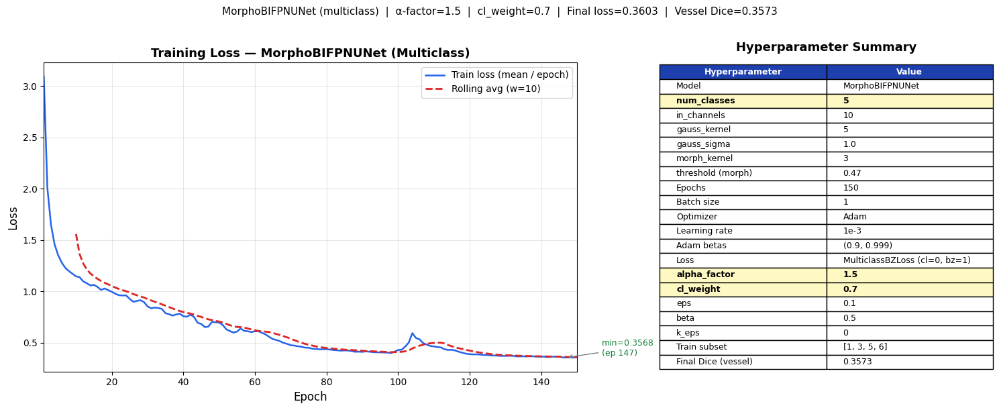

Plot saved → training_diagnostics_morpho_multiclass.png


In [16]:
# ═══════════════════════════════════════════════════════════════════
#  Training diagnostics: loss curve + hyperparameter summary
# ═══════════════════════════════════════════════════════════════════
hparams = {
    'Model'             : 'MorphoBIFPNUNet',
    'num_classes'       : NUM_CLASSES,
    'in_channels'       : 10,
    'gauss_kernel'      : 5,
    'gauss_sigma'       : 1.0,
    'morph_kernel'      : 3,
    'threshold (morph)' : 0.47,
    'Epochs'            : EPOCHS,
    'Batch size'        : BATCH_SIZE,
    'Optimizer'         : 'Adam',
    'Learning rate'     : '1e-3',
    'Adam betas'        : '(0.9, 0.999)',
    'Loss'              : 'MulticlassBZLoss (cl=0, bz=1)',
    'alpha_factor'      : 1.5,
    'cl_weight'         : 0.7,
    'eps'               : 0.1,
    'beta'              : 0.5,
    'k_eps'             : 0,
    'Train subset'      : str(list(best_subset)),
    'Final Dice (vessel)': f'{best_dice:.4f}',
}

fig = plt.figure(figsize=(15, 6))
gs  = gridspec.GridSpec(1, 2, width_ratios=[1.6, 1], figure=fig)

# ── Left: loss curve ──────────────────────────────────────────────────────────
ax_loss = fig.add_subplot(gs[0])
epochs  = np.arange(1, len(training_losses) + 1)
ax_loss.plot(epochs, training_losses, color='#2563EB', linewidth=1.8,
             label='Train loss (mean / epoch)')

if len(training_losses) >= 10:
    window = 10
    smooth = np.convolve(training_losses, np.ones(window) / window, mode='valid')
    ax_loss.plot(np.arange(window, len(training_losses) + 1), smooth,
                 color='#DC2626', linewidth=2, linestyle='--',
                 label=f'Rolling avg (w={window})')

min_val = min(training_losses)
min_ep  = training_losses.index(min_val) + 1
ax_loss.annotate(f'min={min_val:.4f}\n(ep {min_ep})',
                 xy=(min_ep, min_val),
                 xytext=(min_ep + max(1, len(training_losses)//15), min_val * 1.05),
                 arrowprops=dict(arrowstyle='->', color='gray'),
                 fontsize=9, color='#15803D')

ax_loss.set_xlabel('Epoch', fontsize=12)
ax_loss.set_ylabel('Loss',  fontsize=12)
ax_loss.set_title('Training Loss — MorphoBIFPNUNet (Multiclass)', fontsize=13,
                  fontweight='bold')
ax_loss.legend(fontsize=10)
ax_loss.grid(True, alpha=0.3)
ax_loss.set_xlim(1, len(training_losses))

# ── Right: hyperparameter table ───────────────────────────────────────────────
ax_hp = fig.add_subplot(gs[1])
ax_hp.axis('off')
rows = [[k, str(v)] for k, v in hparams.items()]
tbl  = ax_hp.table(cellText=rows, colLabels=['Hyperparameter', 'Value'],
                   loc='center', cellLoc='left')
tbl.auto_set_font_size(False)
tbl.set_fontsize(9)
tbl.scale(1, 1.3)
for c in range(2):
    tbl[(0, c)].set_facecolor('#1E40AF')
    tbl[(0, c)].set_text_props(color='white', fontweight='bold')
for r, (k, _) in enumerate(rows, start=1):
    if k in {'alpha_factor', 'cl_weight', 'num_classes'}:
        for c in range(2):
            tbl[(r, c)].set_facecolor('#FEF9C3')
            tbl[(r, c)].set_text_props(fontweight='bold')

ax_hp.set_title('Hyperparameter Summary', fontsize=13, fontweight='bold', pad=12)

fig.suptitle(
    f'MorphoBIFPNUNet (multiclass)  |  α-factor=1.5  |  cl_weight=0.7  |  '
    f'Final loss={training_losses[-1]:.4f}  |  Vessel Dice={best_dice:.4f}',
    fontsize=11, y=1.01)

fig.tight_layout()
plt.savefig('training_diagnostics_morpho_multiclass.png', dpi=150, bbox_inches='tight')
plt.show()
print('Plot saved → training_diagnostics_morpho_multiclass.png')

## Save the Best Model

In [17]:
if best_model_state is not None:
    os.makedirs('models', exist_ok=True)
    save_path = ('models/best_model_morpho_bifpn_multiclass.pth')
    torch.save(best_model_state, save_path)
    print(f"Best model saved → {save_path}"
          f" (subset {list(best_index)}, vessel Dice = {best_dice:.4f})")
else:
    print('No model was trained.')

Best model saved → models/best_model_morpho_bifpn_multiclass.pth (subset [1, 3, 5, 6], vessel Dice = 0.3573)


## (Optional) Visualise Best Model Predictions

Class               Dice     Sens     Spec     Prec
--------------------------------------------------
  Background      0.9848
  Artery          0.4094
  Vein            0.6165
  Crossing        0.0459
  Uncertainty     0.0000

  Mean vessel Dice (cls 1-3): 0.3573


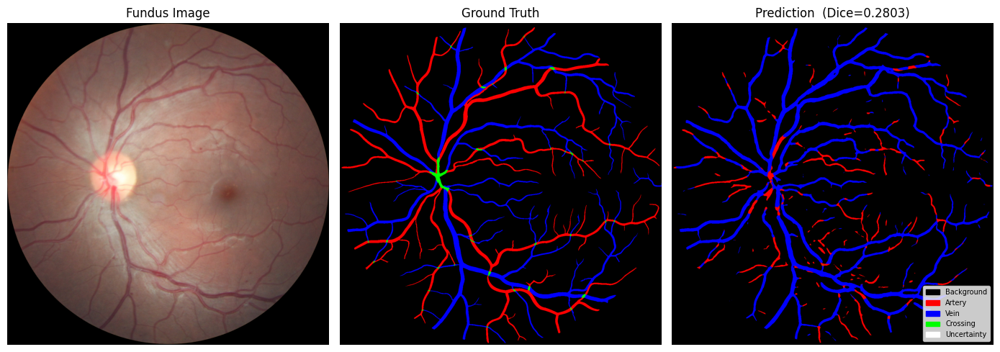

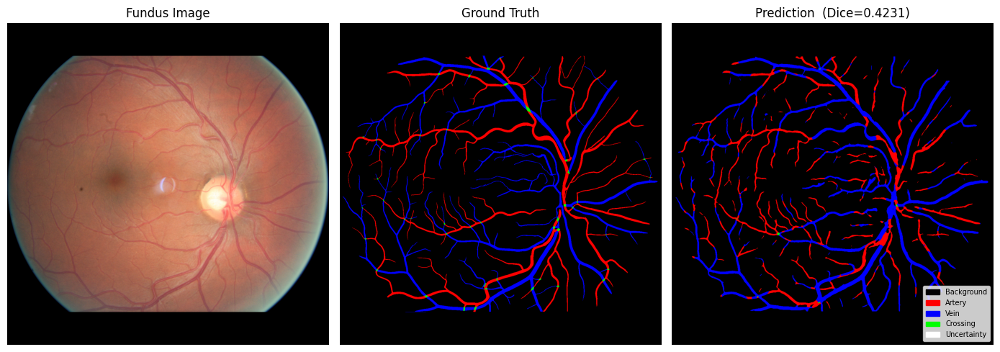

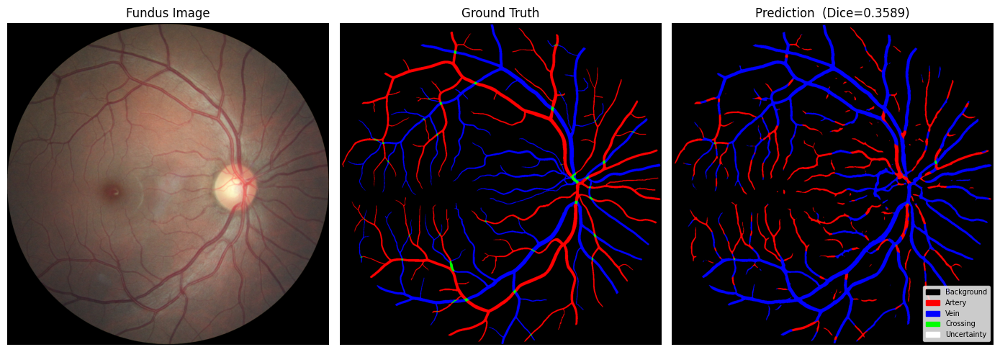

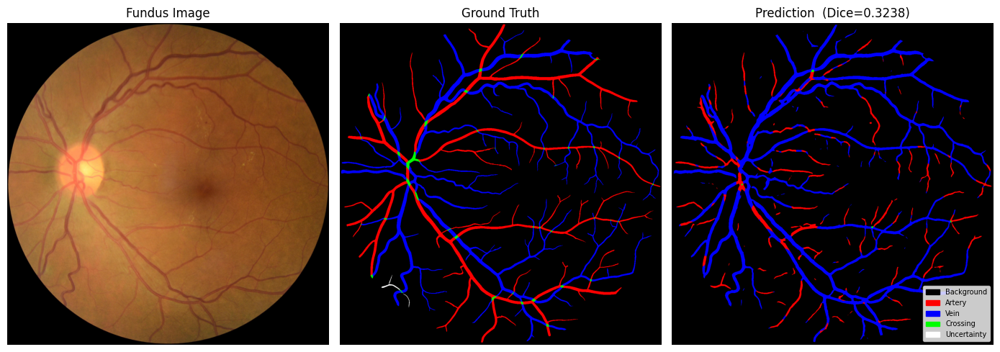

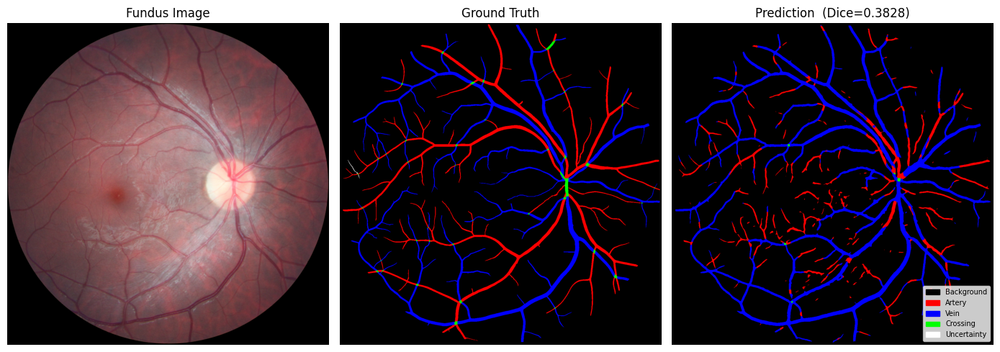

...

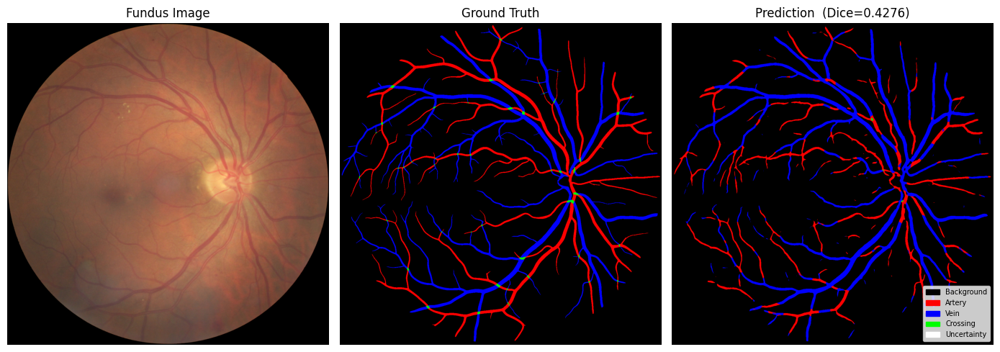

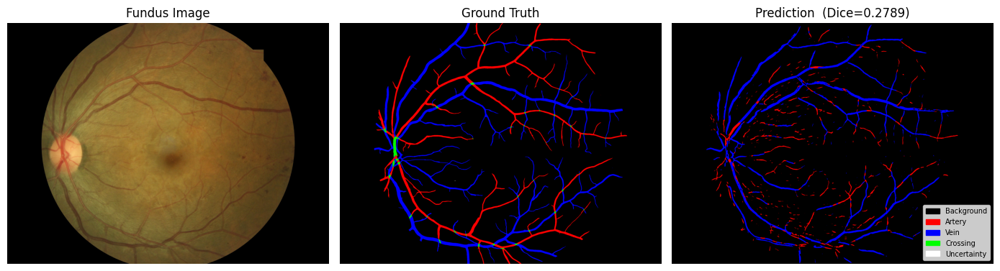

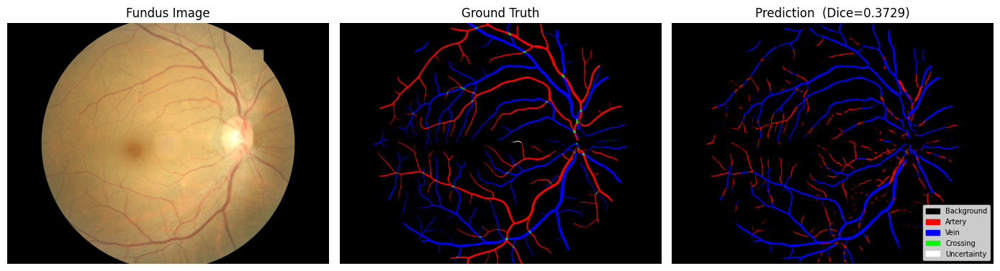

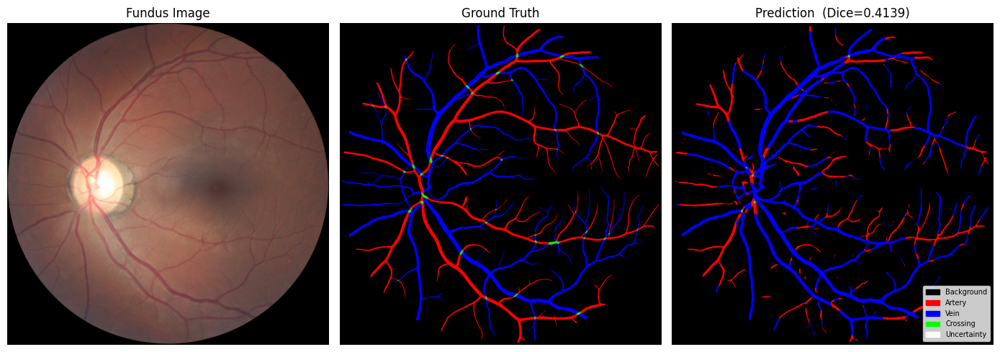

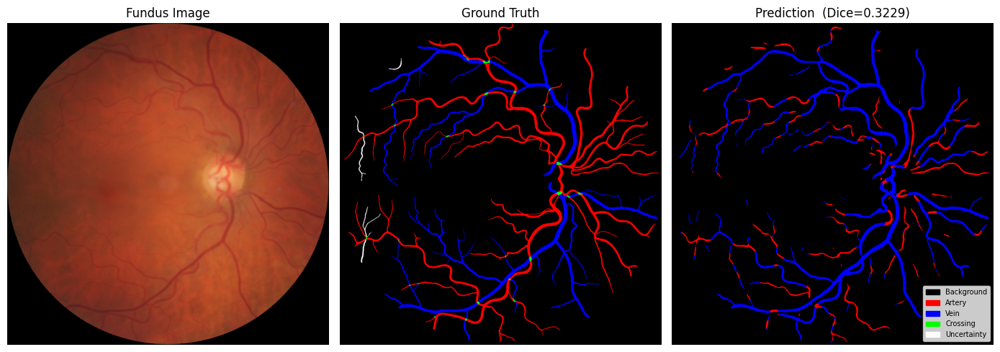

0.35725892005913173

In [18]:
model.eval()
with torch.no_grad():
    # Detailed per-class metrics on the full test set
    print(f"{'Class':<15} {'Dice':>8} {'Sens':>8} {'Spec':>8} {'Prec':>8}")
    print('-' * 50)

    all_class_dice = {c: [] for c in range(NUM_CLASSES)}
    for inputs, inputs_LIOT_vp, labels in dataloaders['test']:
        inputs         = inputs.to(device)
        inputs_LIOT_vp = inputs_LIOT_vp.to(device)
        labels         = labels.to(device)

        logits = model(inputs_LIOT_vp)
        preds  = torch.argmax(torch.softmax(logits, dim=1), dim=1)
        preds  = remove_circle(inputs, preds, 7, 0.1)

        per_class, _ = dice_coef_per_class(preds, labels)
        for c, d in per_class.items():
            all_class_dice[c].append(d)

    for c in range(NUM_CLASSES):
        mean_d = np.mean(all_class_dice[c])
        print(f"  {CLASS_NAMES[c]:<13} {mean_d:>8.4f}")

    mean_vessel = np.mean([np.mean(all_class_dice[c]) for c in VESSEL_CLASSES])
    print(f"\n  Mean vessel Dice (cls 1-3): {mean_vessel:.4f}")

# ── Visual comparison for first test batch ─────────────────────────────────────
test_model(model, BZ=True, display_results=True)

## Grid Search over alpha_factor and cl_weight

Searches for the best combination of `alpha_factor` and `cl_weight` on the fixed 8-image subset, maximising **mean vessel Dice** on the test set.

In [ ]:
ALPHA_FACTORS = [0.1, 0.3, 0.5, 0.7, 1.0, 1.5]
CL_WEIGHTS    = [0.1, 0.3, 0.5, 0.7, 1.0, 1.5]

GS_EPOCHS  = 50
THRESHOLD  = 0.50      # kept for compatibility; predictions use argmax
GS_SEED    = 42


def run_config(alpha_factor, cl_weight, subset_dataloader, epochs=GS_EPOCHS):
    """Train a model with the given hyper-params and return test metrics."""
    torch.manual_seed(GS_SEED)
    random.seed(GS_SEED)
    np.random.seed(GS_SEED)

    m    = MorphoBIFPNUNet(in_channels=10, num_classes=NUM_CLASSES).to(device)
    crit = MulticlassBZLoss(config_loss=0, config_bz=1,
                            class_weights=class_weights)
    opt  = optim.Adam(m.parameters(), lr=1e-3, betas=(0.9, 0.999), eps=1e-07)

    # ── Training ──────────────────────────────────────────────────────────────
    m.train()
    for epoch in range(epochs):
        for inputs, inputs_LIOT_vp, labels in subset_dataloader:
            inputs         = inputs.to(device)
            inputs_LIOT_vp = inputs_LIOT_vp.to(device)
            labels         = labels.to(device)

            opt.zero_grad()
            outputs = m(inputs_LIOT_vp)
            loss = crit(
                outputs, labels, clahe(inputs),
                alpha      = alpha_factor / (inputs.shape[-1] ** 2),
                eps=0.1, beta=0.5, k_eps=0,
                supervised=True, cl_weight=cl_weight,
            )
            loss.backward()
            opt.step()

    # ── Evaluation ────────────────────────────────────────────────────────────
    m.eval()
    total_dice = 0.0
    total_acc  = 0.0
    n          = 0

    with torch.no_grad():
        for inputs, inputs_LIOT_vp, labels in dataloaders['test']:
            inputs         = inputs.to(device)
            inputs_LIOT_vp = inputs_LIOT_vp.to(device)
            labels         = labels.to(device)

            logits = m(inputs_LIOT_vp)
            preds  = torch.argmax(torch.softmax(logits, dim=1), dim=1)
            preds  = remove_circle(inputs, preds, 7, 0.1)

            _, vdice = dice_coef_per_class(preds, labels)
            total_dice += vdice
            total_acc  += accuracy(preds, labels)
            n += 1

    return total_dice / n, total_acc / n, m.state_dict()


# ── Grid search loop ──────────────────────────────────────────────────────────
print(f"Grid search on fixed subset {list(best_subset)}")
print(f"  {len(ALPHA_FACTORS)} × {len(CL_WEIGHTS)} = "
      f"{len(ALPHA_FACTORS)*len(CL_WEIGHTS)} configs × {GS_EPOCHS} epochs each\n")

gs_results     = []
gs_best_dice   = -1.0
gs_best_state  = None
gs_best_params = {}
run_idx = 0

print(f"{'Run':>4} | {'alpha_factor':>12} | {'cl_weight':>9} | "
      f"{'VesselDice':>10} | {'Accuracy':>8}")
print('-' * 58)

for alpha_factor, cl_weight in itertools.product(ALPHA_FACTORS, CL_WEIGHTS):
    run_idx += 1
    dice, acc, state = run_config(alpha_factor, cl_weight, subset_dataloader)

    gs_results.append({
        'alpha_factor': alpha_factor,
        'cl_weight'   : cl_weight,
        'VesselDice'  : round(dice, 4),
        'Accuracy'    : round(acc,  4),
    })

    marker = ' ◄ BEST' if dice > gs_best_dice else ''
    print(f"{run_idx:>4} | {alpha_factor:>12.2f} | {cl_weight:>9.2f} "
          f"| {dice:>10.4f} | {acc:>8.4f}{marker}")

    if dice > gs_best_dice:
        gs_best_dice   = dice
        gs_best_state  = copy.deepcopy(state)
        gs_best_params = {'alpha_factor': alpha_factor, 'cl_weight': cl_weight}

print(f"\nBest config: alpha_factor={gs_best_params['alpha_factor']}, "
      f"cl_weight={gs_best_params['cl_weight']}, "
      f"vessel Dice={gs_best_dice:.4f}")

# ── Results table ─────────────────────────────────────────────────────────────
gs_df = pd.DataFrame(gs_results).sort_values('VesselDice', ascending=False)
print("\nTop-10 configurations:")
print(gs_df.head(10).to_string(index=False))

## Grid Search Results: Vessel Dice Heatmap

In [ ]:
pivot = gs_df.pivot(index='alpha_factor', columns='cl_weight', values='VesselDice')

fig, ax = plt.subplots(figsize=(9, 5))
im = ax.imshow(pivot.values, cmap='RdYlGn', aspect='auto',
               vmin=gs_df['VesselDice'].min(), vmax=gs_df['VesselDice'].max())

ax.set_xticks(range(len(pivot.columns)))
ax.set_xticklabels([str(c) for c in pivot.columns])
ax.set_yticks(range(len(pivot.index)))
ax.set_yticklabels([str(r) for r in pivot.index])
ax.set_xlabel('cl_weight',    fontsize=12)
ax.set_ylabel('alpha_factor', fontsize=12)
ax.set_title('Grid Search — Mean Vessel Dice (Artery+Vein+Crossing)',
             fontsize=13, fontweight='bold')

for i in range(len(pivot.index)):
    for j in range(len(pivot.columns)):
        ax.text(j, i, f'{pivot.values[i, j]:.3f}',
                ha='center', va='center', fontsize=8,
                color='black' if 0.3 < pivot.values[i, j] < 0.8 else 'white')

plt.colorbar(im, ax=ax, label='Mean Vessel Dice')
plt.tight_layout()
plt.savefig('gs_heatmap_multiclass.png', dpi=150, bbox_inches='tight')
plt.show()
print('Heatmap saved → gs_heatmap_multiclass.png')

## Model Parameter Count

In [ ]:
source          = 'MorphoBIFPNUNet (multiclass, num_classes=5)'
total_params    = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
non_trainable   = total_params - trainable_params

print(f"Model source        : {source}")
print(f"Total parameters    : {total_params:,}")
print(f"Trainable params    : {trainable_params:,}")
print(f"Non-trainable params: {non_trainable:,}")

## Final Retrain: Best Grid-Search Hyperparameters (200 Epochs)

Retrains **MorphoBIFPNUNet** from scratch using the `alpha_factor` and `cl_weight` identified by the grid search. Training runs for **200 epochs** on the fixed 8-image subset, with carbon emissions tracked by [CodeCarbon](https://codecarbon.io/). Results are visualised with a loss curve, per-class Dice curve, hyperparameter summary, and carbon-footprint panel.

In [ ]:
assert 'gs_best_params' in dir(), \
    'Run the grid-search cell first so that gs_best_params is defined.'

BEST_ALPHA     = gs_best_params['alpha_factor']
BEST_CL        = gs_best_params['cl_weight']

RETRAIN_EPOCHS = 200
BATCH_SIZE     = 2
SEED           = 42
EVAL_EVERY     = 5      # evaluate test Dice every N epochs
THRESHOLD      = 0.50   # kept for reference; argmax is used for multiclass

print('=' * 65)
print('  Final Retrain — MorphoBIFPNUNet (Multiclass 5-class)')
print(f'  alpha_factor  : {BEST_ALPHA}')
print(f'  cl_weight     : {BEST_CL}')
print(f'  Epochs        : {RETRAIN_EPOCHS}')
print(f'  Dice eval     : every {EVAL_EVERY} epochs  →  best checkpoint kept')
print('=' * 65)

# ── Reproducibility ───────────────────────────────────────────────────────────
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# ── Dataloader (fixed 8-image subset) ────────────────────────────────────────
subset_dataset_final    = torch.utils.data.Subset(train_dataset_full,
                                                  list(best_subset))
subset_dataloader_final = data.DataLoader(subset_dataset_final, shuffle=True,
                                          batch_size=BATCH_SIZE)

# ── Model + loss + optimiser ──────────────────────────────────────────────────
final_model     = MorphoBIFPNUNet(in_channels=10,
                                  num_classes=NUM_CLASSES).to(device)
final_criterion = MulticlassBZLoss(config_loss=0, config_bz=1,
                                   class_weights=class_weights)
final_optimizer = optim.Adam(final_model.parameters(),
                             lr=1e-3, betas=(0.9, 0.999), eps=1e-07)

# ── Tracking containers ───────────────────────────────────────────────────────
retrain_losses      = []                        # mean loss per epoch
dice_checkpoints    = {}                        # epoch → mean vessel dice
perclass_checkpoints = {}                       # epoch → {class: dice}

best_dice_val   = -1.0
best_dice_epoch = -1
best_state      = None

# ── CodeCarbon ────────────────────────────────────────────────────────────────
os.makedirs('carbon_logs', exist_ok=True)
tracker = EmissionsTracker(
    project_name  = 'MorphoBIFPNUNet_multiclass_retrain200',
    output_dir    = 'carbon_logs',
    output_file   = 'emissions_retrain200_multiclass.csv',
    log_level     = 'warning',
    save_to_file  = True,
    tracking_mode = 'process',
)

# ── Training loop ─────────────────────────────────────────────────────────────
tracker.start()
t0 = time.time()

for epoch in range(1, RETRAIN_EPOCHS + 1):

    final_model.train()
    epoch_loss = 0.0
    n_batches  = 0

    for inputs, inputs_LIOT_vp, labels in subset_dataloader_final:
        inputs         = inputs.to(device)
        inputs_LIOT_vp = inputs_LIOT_vp.to(device)
        labels         = labels.to(device)

        final_optimizer.zero_grad()
        outputs = final_model(inputs_LIOT_vp)         # raw logits
        loss = final_criterion(
            outputs, labels, clahe(inputs),
            alpha      = BEST_ALPHA / (inputs.shape[-1] ** 2),
            eps        = 0.1, beta=0.5, k_eps=0,
            supervised = True,
            cl_weight  = BEST_CL,
        )
        loss.backward()
        final_optimizer.step()
        epoch_loss += loss.item()
        n_batches  += 1

    mean_loss = epoch_loss / max(n_batches, 1)
    retrain_losses.append(mean_loss)

    # ── Periodic Dice evaluation ──────────────────────────────────────────────
    if epoch % EVAL_EVERY == 0 or epoch == RETRAIN_EPOCHS:
        final_model.eval()

        all_class_dice_ep = {c: [] for c in range(NUM_CLASSES)}
        with torch.no_grad():
            for inputs, inputs_LIOT_vp, labels in dataloaders['test']:
                inputs         = inputs.to(device)
                inputs_LIOT_vp = inputs_LIOT_vp.to(device)
                labels         = labels.to(device)

                logits = final_model(inputs_LIOT_vp)
                preds  = torch.argmax(torch.softmax(logits, dim=1), dim=1)
                preds  = remove_circle(inputs, preds, 7, 0.1)

                per_cls, _ = dice_coef_per_class(preds, labels)
                for c, d in per_cls.items():
                    all_class_dice_ep[c].append(d)

        mean_per_cls = {c: float(np.mean(v))
                        for c, v in all_class_dice_ep.items()}
        vessel_dice  = float(np.mean([mean_per_cls[c] for c in VESSEL_CLASSES]))

        dice_checkpoints[epoch]     = vessel_dice
        perclass_checkpoints[epoch] = mean_per_cls

        marker = ''
        if vessel_dice > best_dice_val:
            best_dice_val   = vessel_dice
            best_dice_epoch = epoch
            best_state      = copy.deepcopy(final_model.state_dict())
            marker = '  ← best'

        cls_str = '  '.join(
            f'{CLASS_NAMES[c][0]}={mean_per_cls[c]:.3f}' for c in VESSEL_CLASSES)
        print(f'Epoch {epoch:>3}/{RETRAIN_EPOCHS}  |  '
              f'loss={mean_loss:.4f}  |  VesselDice={vessel_dice:.4f}  '
              f'[{cls_str}]{marker}')
    else:
        if epoch % 10 == 0:
            print(f'Epoch {epoch:>3}/{RETRAIN_EPOCHS}  |  loss={mean_loss:.4f}')

emissions_kg = tracker.stop()
elapsed_min  = (time.time() - t0) / 60

# ── Restore best checkpoint ───────────────────────────────────────────────────
final_model.load_state_dict(best_state)
final_model.eval()

print(f"\n{'='*65}")
print(f"  Best Vessel Dice : {best_dice_val:.4f}  (epoch {best_dice_epoch})")
print(f"  Final epoch Dice : {list(dice_checkpoints.values())[-1]:.4f}")
print(f"  Training time    : {elapsed_min:.1f} min")
print(f"  CO₂-eq           : {emissions_kg*1000:.4f} g  ({emissions_kg:.6f} kg)")
print(f"{'='*65}")

# ── Per-class breakdown at best epoch ────────────────────────────────────────
best_perclass = perclass_checkpoints.get(best_dice_epoch, {})
print(f"\nPer-class Dice at best epoch ({best_dice_epoch}):")
for c in range(NUM_CLASSES):
    print(f"  {CLASS_NAMES[c]:<15}: {best_perclass.get(c, float('nan')):.4f}")

# ── Save best model ───────────────────────────────────────────────────────────
os.makedirs('models', exist_ok=True)
save_path = (f'models/best_model_multiclass_retrain200_'
             f'a{BEST_ALPHA}_cl{BEST_CL}.pth')
torch.save(best_state, save_path)
print(f'\nBest model (ep {best_dice_epoch}) saved → {save_path}')

## Results Plot

In [ ]:
epochs_arr  = np.arange(1, RETRAIN_EPOCHS + 1)
dice_epochs = sorted(dice_checkpoints.keys())
dice_values = [dice_checkpoints[e] for e in dice_epochs]

# Per-class dice trajectories
per_cls_trajectories = {c: [perclass_checkpoints[e].get(c, 0.0)
                             for e in dice_epochs]
                        for c in VESSEL_CLASSES}

fig = plt.figure(figsize=(22, 6))
gs_layout = gridspec.GridSpec(1, 4, width_ratios=[1.8, 1.8, 1.5, 0.9],
                               figure=fig, wspace=0.38)

# ── Panel 1: training loss ────────────────────────────────────────────────────
ax_loss = fig.add_subplot(gs_layout[0])
ax_loss.plot(epochs_arr, retrain_losses, color='#2563EB', linewidth=1.4,
             alpha=0.75, label='Train loss (mean / epoch)')
window = 15
if len(retrain_losses) >= window:
    smooth = np.convolve(retrain_losses, np.ones(window)/window, mode='valid')
    ax_loss.plot(np.arange(window, RETRAIN_EPOCHS+1), smooth,
                 color='#DC2626', linewidth=2.0, linestyle='--',
                 label=f'Rolling avg (w={window})')
min_val = min(retrain_losses)
min_ep  = retrain_losses.index(min_val) + 1
ax_loss.annotate(f'min={min_val:.4f}\n(ep {min_ep})',
                 xy=(min_ep, min_val),
                 xytext=(min_ep + max(1, RETRAIN_EPOCHS//12), min_val*1.06),
                 arrowprops=dict(arrowstyle='->', color='gray'),
                 fontsize=8.5, color='#15803D')
ax_loss.set_xlabel('Epoch', fontsize=11)
ax_loss.set_ylabel('Loss',  fontsize=11)
ax_loss.set_title('Training Loss', fontsize=12, fontweight='bold')
ax_loss.legend(fontsize=9)
ax_loss.grid(True, alpha=0.3)
ax_loss.set_xlim(1, RETRAIN_EPOCHS)

# ── Panel 2: per-class + mean vessel Dice ─────────────────────────────────────
ax_dice = fig.add_subplot(gs_layout[1])
cls_colors_plt = {1: '#EF4444', 2: '#3B82F6', 3: '#22C55E'}
for c in VESSEL_CLASSES:
    ax_dice.plot(dice_epochs, per_cls_trajectories[c],
                 color=cls_colors_plt[c], linewidth=1.5, linestyle='--',
                 alpha=0.75, label=CLASS_NAMES[c])
ax_dice.plot(dice_epochs, dice_values, color='#7C3AED', linewidth=2.2,
             marker='o', markersize=3.5, label='Mean Vessel Dice')
ax_dice.axvline(best_dice_epoch, color='#15803D', linewidth=1.4,
                linestyle=':', alpha=0.8)
ax_dice.scatter([best_dice_epoch], [best_dice_val], color='#15803D', s=80,
                zorder=5, label=f'Best: {best_dice_val:.4f} (ep {best_dice_epoch})')
ax_dice.set_xlabel('Epoch', fontsize=11)
ax_dice.set_ylabel('Dice coefficient', fontsize=11)
ax_dice.set_title('Test Dice per class', fontsize=12, fontweight='bold')
ax_dice.legend(fontsize=8.5)
ax_dice.grid(True, alpha=0.3)
ax_dice.set_xlim(1, RETRAIN_EPOCHS)

# ── Panel 3: hyperparameter table ─────────────────────────────────────────────
ax_hp = fig.add_subplot(gs_layout[2])
ax_hp.axis('off')
hparams_final = {
    'Model'              : 'MorphoBIFPNUNet',
    'num_classes'        : NUM_CLASSES,
    'in_channels'        : 10,
    'Epochs'             : RETRAIN_EPOCHS,
    'Batch size'         : BATCH_SIZE,
    'Optimizer'          : 'Adam  lr=1e-3',
    'Loss'               : 'MulticlassBZLoss (cb=1)',
    'alpha_factor ★'     : BEST_ALPHA,
    'cl_weight ★'        : BEST_CL,
    'Dice eval every'    : f'{EVAL_EVERY} epochs',
    'Train subset'       : str(list(best_subset)),
    'Best epoch ★'       : best_dice_epoch,
    'Best Vessel Dice ★' : f'{best_dice_val:.4f}',
    'Final loss'         : f'{retrain_losses[-1]:.4f}',
}
rows = [[k, str(v)] for k, v in hparams_final.items()]
tbl  = ax_hp.table(cellText=rows, colLabels=['Hyperparameter', 'Value'],
                   loc='center', cellLoc='left')
tbl.auto_set_font_size(False)
tbl.set_fontsize(8.5)
tbl.scale(1, 1.28)
for c in range(2):
    tbl[(0, c)].set_facecolor('#1E40AF')
    tbl[(0, c)].set_text_props(color='white', fontweight='bold')
for r, (k, _) in enumerate(rows, start=1):
    if '★' in k:
        for c in range(2):
            tbl[(r, c)].set_facecolor('#FEF9C3')
            tbl[(r, c)].set_text_props(fontweight='bold')
ax_hp.set_title('Hyperparameter Summary', fontsize=12, fontweight='bold', pad=10)

# ── Panel 4: carbon footprint ─────────────────────────────────────────────────
ax_co2 = fig.add_subplot(gs_layout[3])
ax_co2.axis('off')
emissions_g  = emissions_kg * 1_000
emissions_mg = emissions_kg * 1_000_000
carbon_rows  = [
    ['CO₂-eq (kg)',  f'{emissions_kg:.6f}'],
    ['CO₂-eq (g)',   f'{emissions_g:.4f}'],
    ['CO₂-eq (mg)',  f'{emissions_mg:.2f}'],
    ['Train time',   f'{elapsed_min:.1f} min'],
    ['Tracker',      'CodeCarbon'],
]
ctbl = ax_co2.table(cellText=carbon_rows, colLabels=['Metric', 'Value'],
                    loc='center', cellLoc='left')
ctbl.auto_set_font_size(False)
ctbl.set_fontsize(8.5)
ctbl.scale(1, 1.6)
for c in range(2):
    ctbl[(0, c)].set_facecolor('#166534')
    ctbl[(0, c)].set_text_props(color='white', fontweight='bold')
for c in range(2):
    ctbl[(1, c)].set_facecolor('#DCFCE7')
    ctbl[(1, c)].set_text_props(fontweight='bold')
ax_co2.set_title('🌿 Carbon', fontsize=12, fontweight='bold', pad=10)

# ── Global title ──────────────────────────────────────────────────────────────
fig.suptitle(
    f'MorphoBIFPNUNet (multiclass)  |  α={BEST_ALPHA}  cl={BEST_CL}  |  '
    f'Best Vessel Dice={best_dice_val:.4f} (ep {best_dice_epoch})  |  '
    f'CO₂={emissions_g:.4f} g',
    fontsize=11, y=1.01)

plt.savefig('models/retrain200_multiclass_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Plot saved → models/retrain200_multiclass_results.png')